In [1]:
import dask.array as da
import warnings

import dask.array as da
from sklearn.pipeline import Pipeline
from dask_ml.model_selection import train_test_split
from dask_ml.model_selection import GridSearchCV
from dask_ml.decomposition import PCA
from dask_ml.preprocessing import PolynomialFeatures
from dask_ml.linear_model import LinearRegression
import matplotlib.pyplot as plt
import numpy as np
import pandas
from toolz.curried import groupby, valmap, pipe, pluck, merge_with, merge
from toolz.curried import map as fmap

from pymks.fmks.data.elastic_fe import solve
from pymks.fmks.data.multiphase import generate

from pymks.fmks.plot import plot_microstructures
from pymks.fmks.bases.primitive import PrimitiveTransformer
from pymks.fmks.correlations import TwoPointCorrelation, FlattenTransformer
from dask.distributed import Client, progress
import time
from mpl_toolkits import mplot3d
%matplotlib notebook


In [2]:
warnings.filterwarnings('ignore')

%matplotlib inline
%load_ext autoreload
%autoreload 2

# Data Generation

To demonstrate a case study with data larger than memory, we generate three dimensional fiber like structures. We generate XX GB microstructures for example below.


In [3]:
da.random.seed(10)
np.random.seed(10)

tmp = [
    generate(shape=(200, 101, 101,101), grain_size=x, volume_fraction=(0.5, 0.2,0.3), chunks=(10), percent_variance=0.15)
    for x in [(15, 2,2), (2,2, 15), (7,7, 7), (9, 9,3), (9,9, 9), (2, 2,2),(3, 3,3),(12, 4,3),(3, 4,12)]
]
x_data_gen = da.concatenate(tmp)

In [4]:
x_data_gen

,Array,Chunk
Bytes,14.84 GB,82.42 MB
Shape,"(1800, 101, 101, 101)","(10, 101, 101, 101)"
Count,540 Tasks,180 Chunks
Type,int64,numpy.ndarray


In [5]:
print(x_data_gen.shape)
print(x_data_gen.chunks)


(1800, 101, 101, 101)
((10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10), (101,), (101,), (101,))


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.742225 to fit


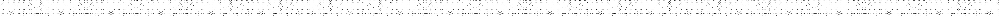

In [6]:
x_data_gen.visualize()

 Following cell demonstrats the our system confuguration.

In [7]:
client = Client()
client

Client Scheduler: tcp://127.0.0.1:41521 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 4 Cores: 8 Memory: 33.59 GB


In [8]:
# client = Client( threads_per_worker=2,
#                 n_workers=2, memory_limit='8GB')
# client

Pipeline  for obtaining PC scores of the large dataset.

In [9]:
bl1 = Pipeline(steps=[
    ("discritize",PrimitiveTransformer(n_state=2, min_=0.0, max_=1.0)),
    ("Correlations",TwoPointCorrelation(periodic_boundary=True, cutoff=15,correlations=[(1,1)])),
    ('flatten', FlattenTransformer()),  
    ('reducer',PCA(n_components=3))])

In [10]:
bl1.fit(x_data_gen).transform(x_data_gen).visualize()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.564374 to fit


This is the step for fitting the PC

In [11]:
tic = time.time()
b=bl1.fit(x_data_gen)
toc = time.time()
print(tic-toc)
print(b)

-0.005147695541381836
Pipeline(memory=None,
         steps=[('discritize',
                 PrimitiveTransformer(chunks=None, max_=1.0, min_=0.0,
                                      n_state=2)),
                ('Correlations',
                 TwoPointCorrelation(correlations=[(1, 1)], cutoff=15,
                                     periodic_boundary=True))],
         verbose=False)


In this step, we do `transform` to obtain the scores

In [12]:
tic = time.time()
b=bl1.transform(x_data_gen).compute()
toc = time.time()
print(tic-toc)
print(b)

-166.3565390110016
[[[[[0.3377877 ]
    [0.33807305]
    [0.33825164]
    ...
    [0.33785175]
    [0.33867967]
    [0.33754117]]

   [[0.33750817]
    [0.3379294 ]
    [0.33824581]
    ...
    [0.33783914]
    [0.33789349]
    [0.33761202]]

   [[0.33815846]
    [0.33774596]
    [0.33715293]
    ...
    [0.33660358]
    [0.33786243]
    [0.33713352]]

   ...

   [[0.33768481]
    [0.33705199]
    [0.33737616]
    ...
    [0.33757417]
    [0.33789058]
    [0.33808567]]

   [[0.33767414]
    [0.33734219]
    [0.33834287]
    ...
    [0.33705102]
    [0.33728396]
    [0.33807984]]

   [[0.33821184]
    [0.33726552]
    [0.33826134]
    ...
    [0.33772461]
    [0.33695978]
    [0.33853214]]]


  [[[0.33779449]
    [0.33800317]
    [0.33832443]
    ...
    [0.33773528]
    [0.33868258]
    [0.33759358]]

   [[0.33764405]
    [0.3380187 ]
    [0.3383419 ]
    ...
    [0.33781196]
    [0.33795658]
    [0.33756155]]

   [[0.33806334]
    [0.33779837]
    [0.33710925]
    ...
    [0.33657834]

 Visualization of the PC scores

ValueError: 'c' argument has 1800 elements, which is not acceptable for use with 'x' with size 1729800, 'y' with size 1729800.

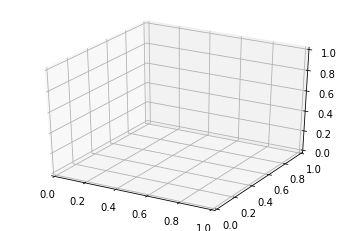

In [13]:
fig = plt.figure()
ax = plt.axes(projection="3d")

# z_line = np.linspace(0, 15, 1000)
# x_line = np.cos(z_line)
# y_line = np.sin(z_line)
# ax.plot3D(x_line, y_line, z_line, 'gray')

z_points = b[:,2]
x_points = b[:,0]
y_points = b[:,1]
ax.scatter3D(x_points, y_points, z_points, c=z_points, cmap='hsv');

plt.show()

 # Code For Cluster